<hr style="height:4px;border:none;color:stillblue;background-color:black;" />

## Exploratory Spatial Data Analysis
Spatial discriptive statistics.  
Aggregation by electoral districtssmall areas.  
Rook and Queen algorithms for nearest neighbors.

### Created by [Georg Anagnostopoulos](https://ganagno.github.io/myblog/cv.html)
### 2021.03.19
### Modified:
- 

In [1709]:
import os
import glob
import math
import itertools
import warnings
warnings.filterwarnings("ignore")

In [1710]:
import numpy as np
import pandas as pd
import geopandas as gpd
import gtfs_kit as gk
import contextily as ctx
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
pd.set_option('display.max_columns', None)

In [1711]:
import esda
import libpysal
from libpysal.weights import W, Queen, Rook, KNN, spatial_lag, fuzzy_contiguity
from splot.esda import plot_moran, plot_local_autocorrelation, lisa_cluster
from scipy.spatial import Delaunay, cKDTree   
from numpy import linalg as la

In [1712]:
import colorcet as cc
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib
%matplotlib inline

***********

In [1713]:
def browser(path):
    files = []
    for file in glob.glob(path):
        files.append(file)
        print(file)
    return files

In [1562]:
def srtedg(e):
    """
    Small routine to order an edge from its lower to its upper index.
    """
    if e[0] > e[1]:
        return (e[1], e[0])
    return (e[0], e[1])

In [1563]:
def delaunay_graph(points):
    """
    Calculates the delaunay triangulation of a set of points, and returns
    its edges.
    """
    # Calculate the Delaunay triangulation.
    triangulation = Delaunay(points)
    # Get all its edges
    edgs = set()
    for tri in triangulation.simplices:
        triedgs = []
        for edg in itertools.combinations(tri, 2):
            edgs.add(srtedg(edg))

    return list(edgs)

In [1564]:
def gabriel_graph(points, matrix=None, tree_c=None, dt_c=None):
    """
    Calculates the gabriel graph of a set of points, and then returns
    its edges.
    The gabriel graph is the pair of points, that given a circle (sphere, hypersphere),
    with its center in the middle of the points that passes through those points,
    the circle does not contain any other point of the sample.
    """
    if matrix is None:
        matrix = {}
    initial = delaunay_graph(points)
    if dt_c is not None:
        dt_c['dt'] = initial
    tree = cKDTree(points)
    if tree_c is not None:
        tree_c['tree'] = tree
    gabriel = []
    for e0, e1 in initial:
        p0 = np.array(points[e0])
        p1 = np.array(points[e1])
        mid = (p0 + p1) / 2.0
        dis = la.norm(p1 - p0)
        rad = dis / 2.0
        cls = tree.query_ball_point(mid, rad)
        matrix[(e0, e1)] = dis
        for i in cls:
            if i != e0 and i != e1:
                break
        else:
            gabriel.append((e0, e1))
    return gabriel

In [1565]:
def relative_neighborhood_graph(points, matrix=None, dt_c=None):
    """
    Calculates the relative neighborhood graph.
    The relative neighborhood graph is the graph that
    given two points, it has an edge if there's no point
    that's closer to both of them.
    """
    if matrix is None:
        matrix = {}
    tree_c = {}
    initial = gabriel_graph(points, matrix, tree_c, dt_c)
    tree = tree_c['tree']
    rng = []
    sin60 = math.sin(math.radians(60))
    for e0, e1 in initial:
        p0 = points[e0]
        p1 = points[e1]
        p0 = np.array(p0)
        p1 = np.array(p1)
        mid = (p0 + p1) / 2.0
        dis = matrix[(e0, e1)]
        rad = dis * sin60
        cls = tree.query_ball_point(mid, rad)
        for i in cls:
            if i != e0 and i != e1:
                ei0 = srtedg((i, e0))
                if ei0 in matrix:
                    d0 = matrix[ei0]
                else:
                    d0 = la.norm(np.array(points[i]) - p0)
                    matrix[ei0] = d0
                ei1 = srtedg((i, e1))
                if ei1 in matrix:
                    d1 = matrix[ei1]
                else:
                    d1 = la.norm(np.array(points[i]) - p1)
                    matrix[ei1] = d1

                if d0 < dis and d1 < dis:
                    break
        else:
            rng.append((e0, e1))
    return rng

In [1648]:
def to_adjacency_matrix(pairs):
    size = 1 + max(map(max, pairs))
    a = [[0 for j in range(size)] for i in range(size)]
    for i, j in pairs:
        a[i][j] = a[j][i] = 1
    return a

******************************

# Load ValOff

In [6]:
path = './data/ValOff/*.gzip'
files = browser(path)

./data/ValOff/DUBLIN.parquet.gzip
./data/ValOff/DUBLIN_BUILDING_ID.parquet.gzip


In [7]:
# Load valoff.
valoff = gpd.read_parquet(files[-1])
valoff['BUILDING_ID'] = valoff['BUILDING_ID'].astype('int').astype('str')
valoff.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: unnamed
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [8]:
print(valoff.PropertyNumber.unique().shape)
print(valoff.BUILDING_ID.unique().shape)
valoff.head()

(35515,)
(14872,)


,Xitm,Yitm,PropertyNumber,PublicationDate,Address1,Address2,Address3,Address4,Address5,CarPark,Category,County,LocalAuthority,Uses,Valuation,F_,F_0,F_1,F_-1,F_MEZZ,F_2,F_3,F_4,F_5,Area,Nav,NavPerM2,geometry,lat,lon,BUILDING_ID,point
0,698383.620264,723982.399664,2166212,2017-09-15,Farmervale,Rathcoole,Co. Dublin,,,0,RETAIL (SHOPS),DUBLIN,SOUTH DUBLIN COUNTY COUNCIL,"SHOP, -",79700.0,0,2,1,0,1,0,0,0,0,1392.87,79721.600,57.235492,POINT (-726416.092 7030690.373),53.257066,-6.525507,1400440323,POINT (-726420.136 7030680.355)
1,698601.500000,728580.510000,5004541,2017-09-15,Lyons Road,Newcastle,Co Dublin,,,0,INDUSTRIAL USES,DUBLIN,SOUTH DUBLIN COUNTY COUNCIL,"WORKSHOP, -",6240.0,0,1,0,0,0,0,0,0,0,178.33,6241.550,35.000000,POINT (-725894.000 7038373.560),53.298335,-6.520817,1400360501,POINT (-725902.027 7038353.655)
2,698601.960000,728580.280000,446595,2017-09-15,Lyons Road,Newcastle,Co Dublin,,,0,INDUSTRIAL USES,DUBLIN,SOUTH DUBLIN COUNTY COUNCIL,"WAREHOUSE, -",33600.0,0,1,1,0,0,0,0,0,0,1121.71,33651.300,30.000000,POINT (-725893.240 7038373.160),53.298333,-6.520810,1400360501,POINT (-725902.027 7038353.655)
3,698601.960000,728580.280000,449490,2017-09-15,Lyons Road,Newcastle,Co Dublin .,,,0,INDUSTRIAL USES,DUBLIN,SOUTH DUBLIN COUNTY COUNCIL,"WORKSHOP, -",23500.0,0,6,0,0,0,0,0,0,0,1070.50,23518.388,21.969536,POINT (-725893.240 7038373.160),53.298333,-6.520810,1400360501,POINT (-725902.027 7038353.655)
4,698613.850000,728584.090000,5004540,2017-09-15,Lyons Road,Newcastle,Co Dublin,,,0,INDUSTRIAL USES,DUBLIN,SOUTH DUBLIN COUNTY COUNCIL,"WORKSHOP, -",8200.0,0,1,0,0,0,0,0,0,0,182.24,8200.800,45.000000,POINT (-725873.260 7038379.123),53.298365,-6.520630,1400360501,POINT (-725902.027 7038353.655)


**************************

# Load Eircode

In [9]:
path = './data/Eircode/*.gzip'
files = browser(path)

./data/Eircode/152_full_ecad_2020_q3.parquet.gzip
./data/Eircode/152_full_ecad_2020_q4.parquet.gzip


In [10]:
# Load eircode.
eircode = gpd.read_parquet(files[-1])

In [11]:
# Get all addresses in Dublin.
dublin = eircode[(eircode.COUNTY == 'DUBLIN')]
dublin = dublin[dublin.ITM_NORTH.notna()]
dublin['CODE'] = dublin['CODE'].astype('category')
dublin['LA_ID'] = dublin['LA_ID'].astype('int').astype('str')
dublin['DED_ID'] = dublin['DED_ID'].astype('int').astype('str')
dublin['SMALL_AREA_ID'] = dublin['SMALL_AREA_ID'].astype('int')
dublin.reset_index(drop=True, inplace=True)
dublin.crs

<Projected CRS: EPSG:2157>
Name: IRENET95 / Irish Transverse Mercator
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe - Ireland (Republic and Ulster) - onshore
- bounds: (-10.56, 51.39, -5.34, 55.43)
Coordinate Operation:
- name: Irish Transverse Mercator
- method: Transverse Mercator
Datum: IRENET95
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [12]:
# Convert to Pseudo-Mercator for cartography.
dublin = dublin.to_crs(epsg=3857)
dublin.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [13]:
# All buildings in Dublin.
buildings = dublin.groupby(
    ['BUILDING_ID', 'DED_ID', 'SMALL_AREA_ID',
     'BUILDING_USE']).count().ECAD_ID.reset_index()
buildings = buildings.sort_values(by=['ECAD_ID'],
                                      ascending=False).reset_index(drop=True)
buildings.rename(columns={'ECAD_ID': 'freq'}, inplace=True)
# Residential counts.
res_mask = (buildings.BUILDING_USE == 'R')
buildings['res_freq'] = 0
buildings.loc[res_mask, 'res_freq'] = buildings.loc[res_mask, 'freq']
# Commercial and unknown counts.
com_mask = (buildings.BUILDING_USE.isin(['C', 'U']))
buildings['com_freq'] = 0
buildings.loc[com_mask, 'com_freq'] = buildings.loc[com_mask, 'freq']
# Mixed counts assumption: 1 commercial, rest residential.
both_mask = (buildings.BUILDING_USE.isin(['B']))
buildings.loc[both_mask, 'res_freq'] = buildings.loc[both_mask, 'freq'] - 1
buildings.loc[both_mask, 'com_freq'] = 1
# Building type id
buildings['BUILDING_TYPE_ID'] = dublin.groupby(
    ['BUILDING_ID', 'DED_ID', 'SMALL_AREA_ID',
     'BUILDING_USE'])['BUILDING_TYPE_ID'].first().values
buildings['BUILDING_ID'] = buildings['BUILDING_ID'].astype('int').astype('str')
buildings

,BUILDING_ID,DED_ID,SMALL_AREA_ID,BUILDING_USE,freq,res_freq,com_freq,BUILDING_TYPE_ID
0,1401156145,268106,12896,C,204,0,204,2.0
1,1401157141,268140,16827,R,179,179,0,2.0
2,1401164122,267029,8526,C,169,0,169,2.0
3,1401175525,268143,18223,R,163,163,0,1.0
4,1400466095,268150,16880,C,159,0,159,7.0
...,...,...,...,...,...,...,...,...
441445,1400950696,268095,11948,R,1,1,0,2.0
441446,1400950695,268095,11948,R,1,1,0,2.0
441447,1400950694,268031,16143,R,1,1,0,2.0
441448,1400950693,268031,16143,R,1,1,0,2.0


********************************

# Load Shapefiles

In [14]:
# https://data-osi.opendata.arcgis.com/datasets/c6275fc7a11a471f9bd037d6e1b3d1f0_0
ed = gpd.read_file(
    'zip:////home/georg/Jupyter/data/Electoral_Divisions_-_OSi_National_Statutory_Boundaries.zip'
)
ed.crs

<Projected CRS: EPSG:2157>
Name: IRENET95 / Irish Transverse Mercator
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Ireland - onshore. United Kingdom (UK) - Northern Ireland (Ulster) - onshore.
- bounds: (-10.56, 51.39, -5.34, 55.43)
Coordinate Operation:
- name: Irish Transverse Mercator
- method: Transverse Mercator
Datum: IRENET95
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [15]:
# Convert to Pseudo-Mercator for cartography.
ed = ed.to_crs(epsg=3857)
ed.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

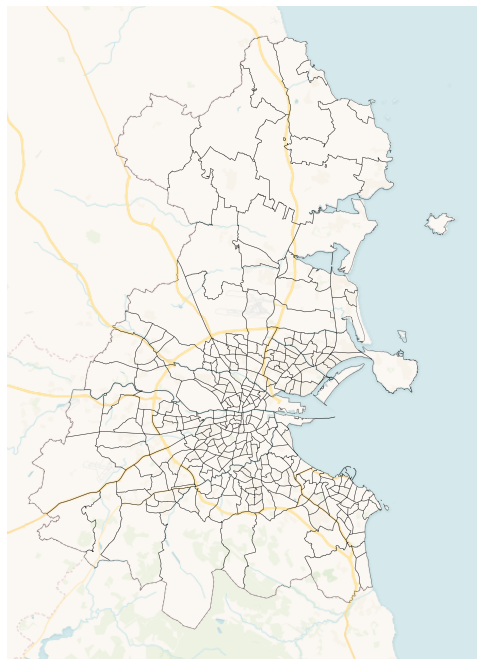

In [16]:
# Specify maptiles source.
source = ctx.providers.CartoDB.VoyagerNoLabels
ax = ed[ed.COUNTY == 'DUBLIN'].plot(alpha=.5, fc='none', ec='k', lw=.5, figsize=(12, 12))
ax.set_axis_off()
ctx.add_basemap(ax, attribution=False, source=source, zoom=10)

In [17]:
# https://data-osi.opendata.arcgis.com/datasets/c85e610da1464178a2cd84a88020c8e2_3
sa = gpd.read_file(
    'zip:////home/georg/Jupyter/data/Small_Areas_Ungeneralised_-_OSi_National_Statistical_Boundaries_-_2015-shp.zip'
)
sa.crs

<Projected CRS: EPSG:2157>
Name: IRENET95 / Irish Transverse Mercator
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Ireland - onshore. United Kingdom (UK) - Northern Ireland (Ulster) - onshore.
- bounds: (-10.56, 51.39, -5.34, 55.43)
Coordinate Operation:
- name: Irish Transverse Mercator
- method: Transverse Mercator
Datum: IRENET95
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [18]:
# Convert to Pseudo-Mercator for cartography.
sa = sa.to_crs(epsg=3857)
sa.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

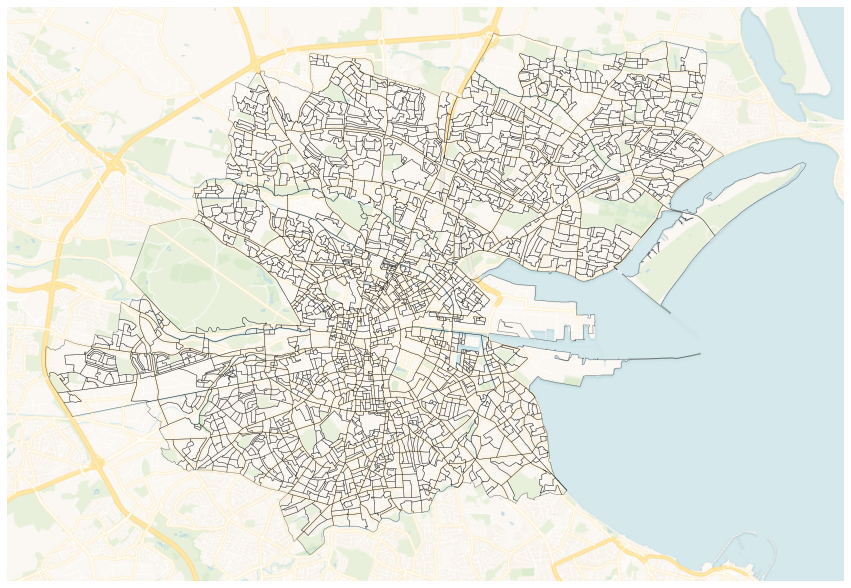

In [19]:
# Specify maptiles source.
source = ctx.providers.CartoDB.VoyagerNoLabels
ax = sa[sa.COUNTYNAME == 'Dublin City'].plot(
    alpha=.5,
    ec='k',
    fc='none',
    lw=.5,
    figsize=(15, 15),
)
ax.set_axis_off()
ctx.add_basemap(ax, attribution=False, source=source, zoom=12)

# GTFS

In [20]:
path = './data/google_transit_combined.zip'
feed = gk.read_feed(path, dist_units='m')
# Geometrize shapes.
shapes = feed.geometrize_shapes(use_utm=True)
shapes = shapes.to_crs(epsg=3857)
gk.list_feed(path)

,file_name,file_size
0,agency.txt,456
1,routes.txt,53206
2,trips.txt,20662950
3,stops.txt,822067
4,calendar.txt,3822
5,calendar_dates.txt,14239
6,shapes.txt,129419183
7,transfers.txt,285280
8,stop_times.txt,571854741


In [21]:
#feed.compute_busiest_date(feed.calendar_dates.date.sort_values().unique()[:30])
feed.describe()

,indicator,value
0,agencies,"[GoAhead Commuter, Dublin Bus, Bus Éireann, Ex..."
1,timezone,Europe/Dublin
2,start_date,20210319
3,end_date,20211231
4,num_routes,737
5,num_trips,168072
6,num_stops,9955
7,num_shapes,3353
8,sample_date,20210325
9,num_routes_active_on_sample_date,356


**************************************

# Descriptive statistics

In [22]:
# Helper function for plotting.
def plotter(df, lag, column1, column2, label, cutoff=-2, layout='portrait'):
    # Specify maptiles source.
    source = ctx.providers.CartoDB.DarkMatterNoLabels
    if layout == 'portrait':
        num_rows = 1
        num_cols = 2
        wspace = .15
        hspace = 0
        figsize = (18, 12)
        zoom = 10
    else:
        num_rows = 2
        num_cols = 1
        wspace = 0
        hspace = 0.05
        figsize = (15, 18)
        zoom = 12

    vmin = df[f'{column2}'].min()
    if cutoff > 0:
        vmax = cutoff
    else:
        vmax = df[f'{column2}'].max()

    fig, ax = plt.subplots(num_rows, num_cols, figsize=figsize)
    fig.tight_layout()
    fig.subplots_adjust(wspace=wspace, hspace=hspace)
    divider0 = make_axes_locatable(ax[0])
    cax0 = divider0.append_axes('right', size='3%', pad='0%')
    df.plot(column=column1,
            ax=ax[0],
            cax=cax0,
            ec='none',
            vmin=vmin,
            vmax=vmax,
            cmap=cc.m_CET_L8,
            legend=True,
            legend_kwds={
                'label': label,
            })
    lag.plot(df,
             ax=ax[0],
             edge_kws=dict(color='w', linestyle=':', linewidth=.3),
             node_kws=dict(marker=''))
    ax[0].set_axis_off()
    ctx.add_basemap(ax[0], attribution=False, source=source, zoom=zoom)
    divider1 = make_axes_locatable(ax[1])
    cax1 = divider1.append_axes('right', size='3%', pad='0%')
    df.plot(column=column2,
            ax=ax[1],
            cax=cax1,
            ec='none',
            vmin=vmin,
            vmax=vmax,
            cmap=cc.m_CET_L8,
            legend=True,
            legend_kwds={
                'label': f'{label} - spatial lag',
            })
    ax[1].set_axis_off()
    ctx.add_basemap(ax[1], attribution=False, source=source, zoom=zoom)
    fig.tight_layout()
    if layout == 'portrait':
        fig.savefig(f'./data/Eircode/{column1}_ed.png', format='png', dpi=200)
    else:
        fig.savefig(f'./data/Eircode/{column1}_sa.png', format='png', dpi=200)

# Electoral district statistics with spatial lag
https://geographicdata.science/book/notebooks/06_spatial_autocorrelation.html

In [236]:
# Percentage of commercial items.
ed_sum = buildings[['freq', 'res_freq', 'com_freq',
                    'DED_ID']].groupby(['DED_ID']).sum()
ed_sum = pd.merge(ed, ed_sum, right_index=True, left_on='ED_ID', how='right')
ed_sum['com_ratio'] = ed_sum['com_freq'] / ed_sum['freq']
ed_sum.reset_index(drop=True, inplace=True)

In [237]:
# Averaging.
ed_average = pd.merge(buildings, valoff, on='BUILDING_ID', how='right')[[
    'Valuation', 'Area', 'Nav', 'NavPerM2', 'DED_ID'
]].groupby(['DED_ID']).mean()

In [238]:
# Merge all statistics.
ed_stats = pd.merge(ed_sum,
                    ed_average,
                    right_index=True,
                    left_on='ED_ID',
                    how='left')

In [239]:
# Generate network.
ed_border = ed_stats.dissolve(by='COUNTY', aggfunc='first')
ed_network = gpd.overlay(shapes, ed_border[['geometry']])
ed_trips = feed.trips[feed.trips.shape_id.isin(ed_network.shape_id)]
trip_stats = feed.compute_trip_stats(ed_trips.route_id.unique())
route_stats = trip_stats.drop_duplicates(subset=['shape_id'])
ed_network = ed_network.merge(
    route_stats,
    how='inner',
    on='shape_id',
)
ed_network['speed'] = ed_network.speed / 1000

In [240]:
# Network statistics.
ed_stats['speed'] = gpd.sjoin(
    ed_stats, ed_network, how='left',
    op='intersects').groupby('ED_ID').speed.mean().values
ed_stats['num_stops'] = gpd.sjoin(
    ed_stats, ed_network, how='left',
    op='intersects').groupby('ED_ID').num_stops.sum().values
ed_stats.fillna(0, inplace=True)

In [1838]:
# Generate W from the GeoDataFrame.
ed_w = Rook.from_dataframe(ed_stats)

In [1839]:
## Include self.
#for i, _ in enumerate(ed_w.neighbors):
#    indices = ed_w.neighbors[i]
#    indices.append(i)
#    ed_w.neighbors.update({i: indices})
#    ed_w.weights.update({i: [1] * len(indices)})

In [1840]:
# Initialize identity.
n = ed_stats.shape[0]
I = np.identity(n)
one = np.ones((n, 1))
H = I - one @ one.T / n

In [1841]:
# Gabriel graph from centroids.
points = np.vstack((ed_stats.geometry.centroid.x.values,
                    ed_stats.geometry.centroid.y.values)).T
edges = gabriel_graph(points)
A = to_adjacency_matrix(edges)
A += I

In [1842]:
# Update weights
for i, _ in enumerate(ed_w):
    indices = np.where(A[i]==1)[0]
    ed_w.neighbors.update({i: list(indices)})
    ed_w.weights.update({i: [1] * len(indices)})

In [1843]:
# Custom weights
neighbors = ed_w.neighbors
weights = ed_w.weights
ed_w = W(neighbors, weights)

In [1844]:
# Row-standardization.
ed_w.transform = 'R'

In [1856]:
# Make symmetric
S, ids = ed_w.full()
C = 0.5 * (S + S.T)
one.T @ C @ one

array([[322.]])

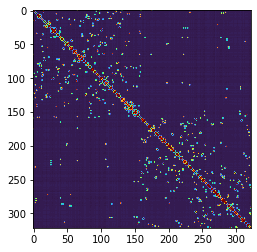

In [1857]:
omega = H @ C @ H
ax = plt.imshow(omega, vmax=.1, cmap='turbo')

In [1858]:
# Calculate eigenvectors (vec) and eigenvalues (val).
val, vec = la.eig(omega)
sortid = val.argsort()[::-1]
val = np.real(val[sortid])
vec = np.real(vec[:, sortid])

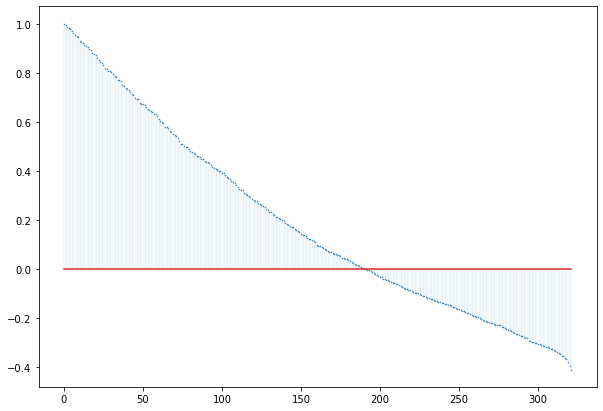

In [1859]:
fig, ax = plt.subplots(figsize=(10, 7))

markerline, stemlines, baseline = plt.stem(val)
plt.setp(stemlines, 'linewidth', .1)
plt.setp(markerline, 'ms', .5)
plt.show()

In [1861]:
rank = 3
ed_stats['v1'] = vec.T[rank]
val[rank]

0.9829852809976177

In [1862]:
#(n / (one.T @ C @ one) * val[rank])[0][0]

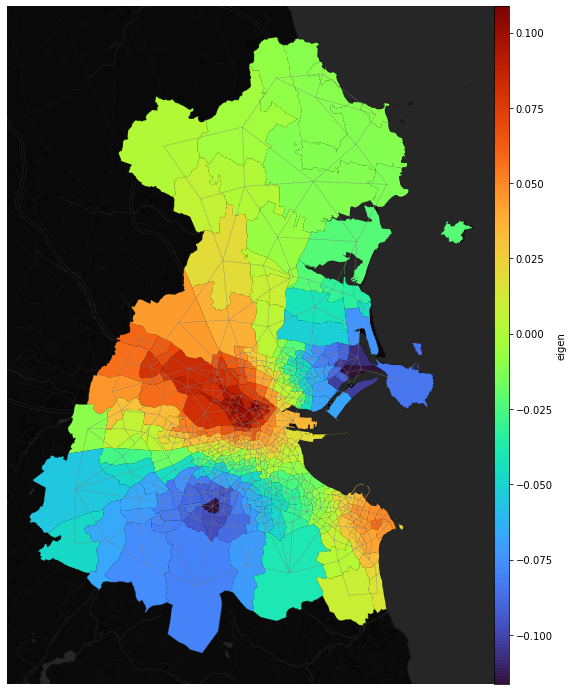

In [1863]:
# Specify maptiles source.
source = ctx.providers.CartoDB.DarkMatterNoLabels
fig, ax = plt.subplots(figsize=(10, 10))
fig.tight_layout()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='3%', pad='0%')
ed_w.plot(ed_stats,
          ax=ax,
          edge_kws=dict(color='grey', linestyle=':', linewidth=.5))
ed_stats.plot(
    column='v1',
    ax=ax,
    cax=cax,
    cmap='turbo',
    legend=True,
    legend_kwds={
        'label': 'eigen',
    },
)
ax.set_axis_off()
ctx.add_basemap(ax, attribution=False, source=source, zoom=11)

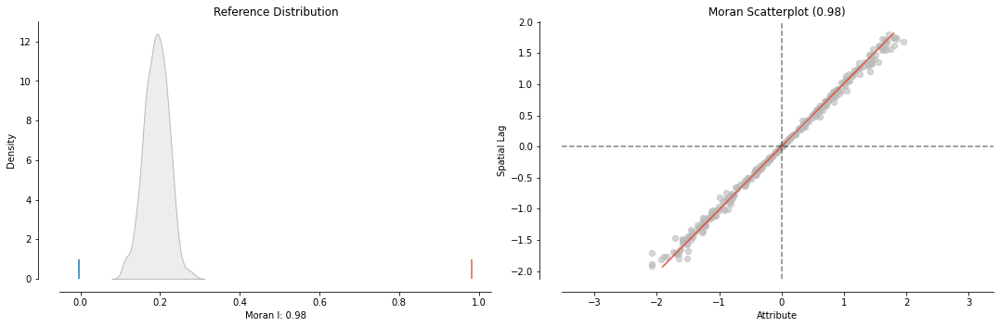

In [1864]:
column = 'v1'
moran = esda.moran.Moran(ed_stats[column], ed_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.tight_layout()

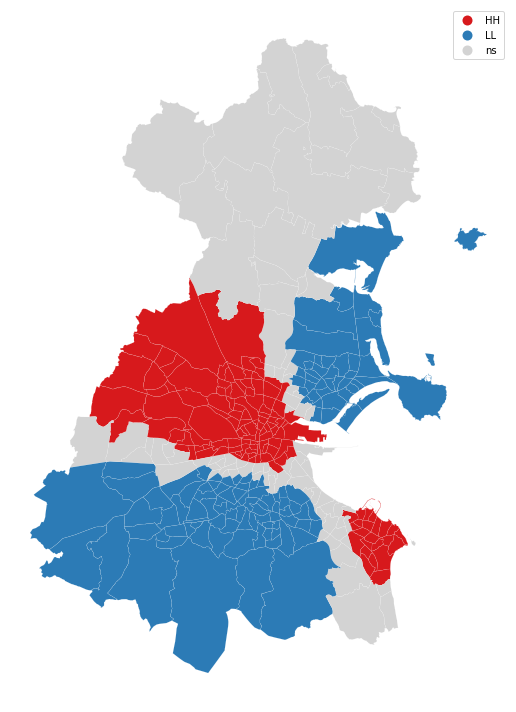

In [1865]:
lisa = esda.moran.Moran_Local(ed_stats[column], ed_w)
fig = lisa_cluster(lisa, ed_stats, p=.2, figsize=(15, 10))[0]
fig.tight_layout()
plt.show()

In [1866]:
# Calculate spatial lag.
ed_stats['freq_lag'] = spatial_lag.lag_spatial(ed_w, ed_stats['freq'])
ed_stats['com_freq_lag'] = spatial_lag.lag_spatial(ed_w, ed_stats['com_freq'])
ed_stats['com_ratio_lag'] = ed_stats['com_freq_lag'] / ed_stats['freq_lag']
ed_stats['speed_lag'] = spatial_lag.lag_spatial(ed_w, ed_stats['speed'])
ed_stats['num_stops_lag'] = spatial_lag.lag_spatial(ed_w, ed_stats['num_stops'])
ed_stats['NavPerM2_lag'] = spatial_lag.lag_spatial(ed_w, ed_stats['NavPerM2'])
ed_stats['Nav_lag'] = spatial_lag.lag_spatial(ed_w, ed_stats['Nav'])
ed_stats['Area_lag'] = spatial_lag.lag_spatial(ed_w, ed_stats['Area'])

## Transit network overview

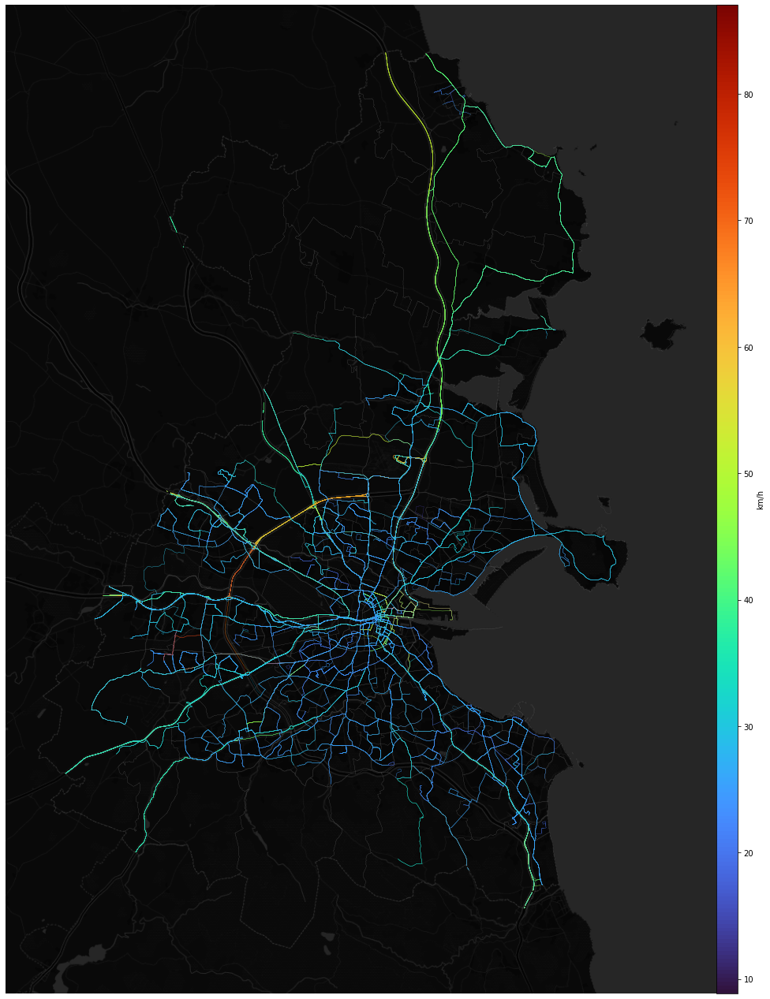

In [1536]:
# Specify maptiles source.
source = ctx.providers.CartoDB.DarkMatterNoLabels
fig, ax = plt.subplots(figsize=(15, 18))
fig.tight_layout()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='3%', pad='0%')
ed_stats.plot(lw=.1, ec='grey', fc='none', ax=ax, zorder=1)
ed_network.plot(
    column='speed',
    lw=.2,
    ax=ax,
    cax=cax,
    zorder=10,
    cmap='turbo',
    legend=True,
    legend_kwds={
        'label': 'km/h',
    },
)
ax.set_axis_off()
ctx.add_basemap(ax, attribution=False, source=source, zoom=11)

## Number of stops

num_stops is statistically significant


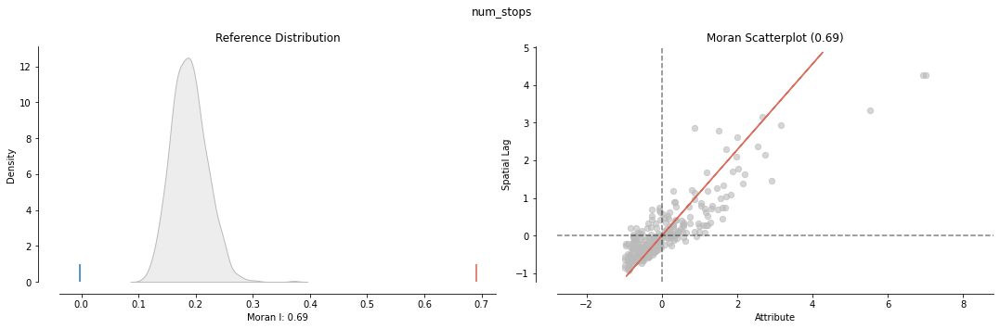

In [1758]:
column = 'num_stops'
moran = esda.moran.Moran(ed_stats[column], ed_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_ed_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

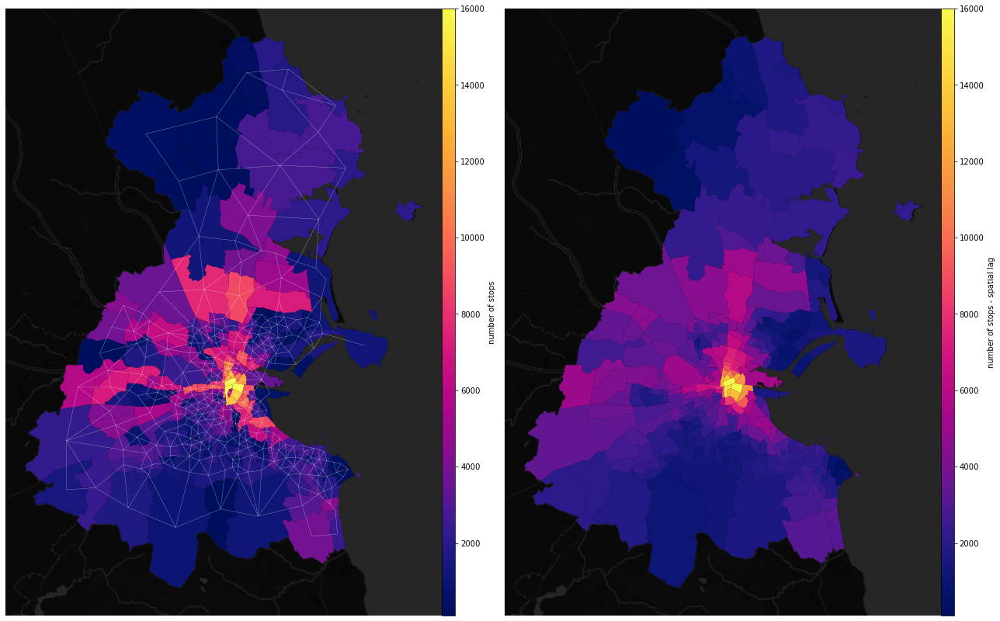

In [1759]:
label = 'number of stops'
plotter(ed_stats, ed_w, column, f'{column}_lag', label, 16000)

##  Mean transit speed

speed is statistically significant


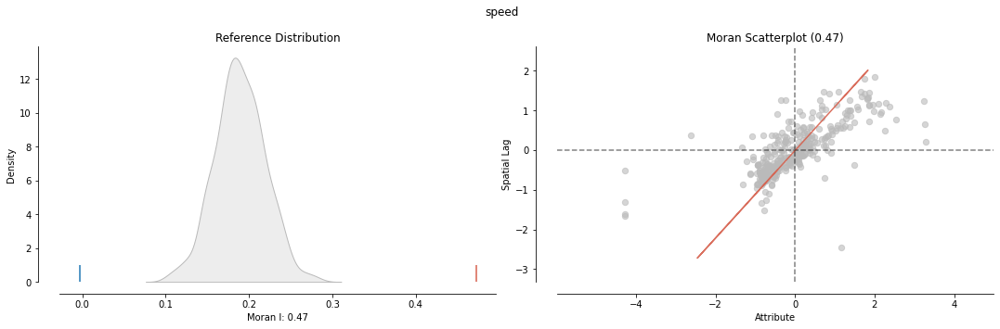

In [1683]:
column = 'speed'
moran = esda.moran.Moran(ed_stats[column], ed_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_ed_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

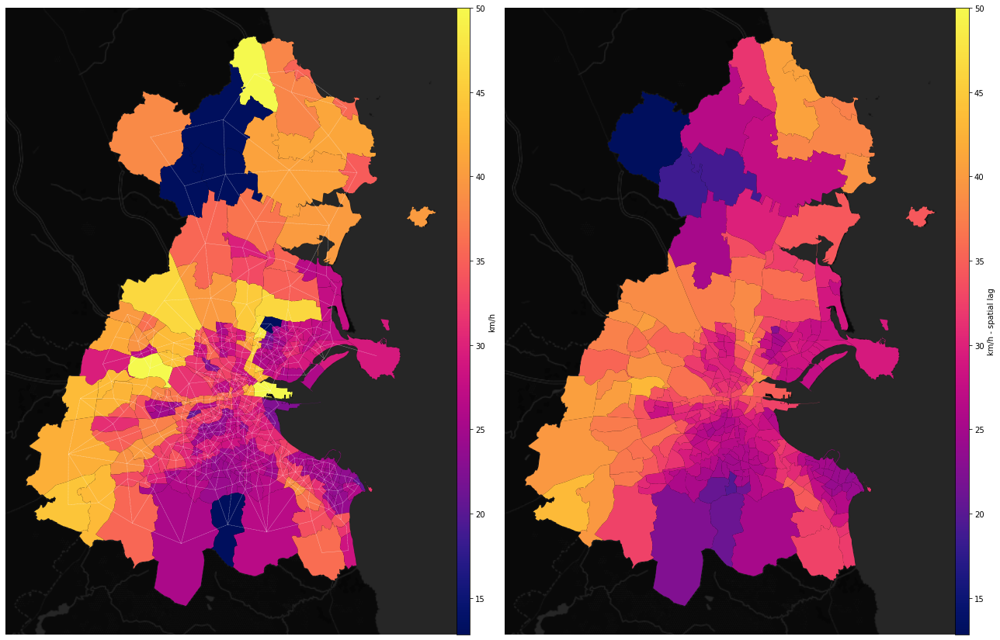

In [1684]:
label = 'km/h'
plotter(ed_stats, ed_w, column, f'{column}_lag', label, 50)

##  Commercial share

com_ratio is statistically significant


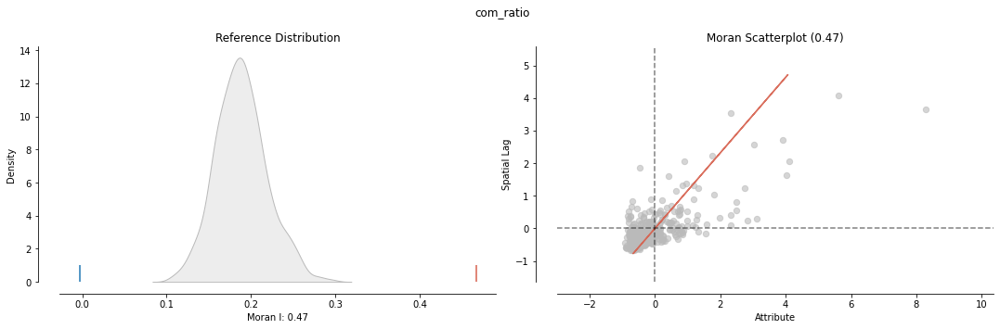

In [1685]:
column = 'com_ratio'
moran = esda.moran.Moran(ed_stats[column], ed_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_ed_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

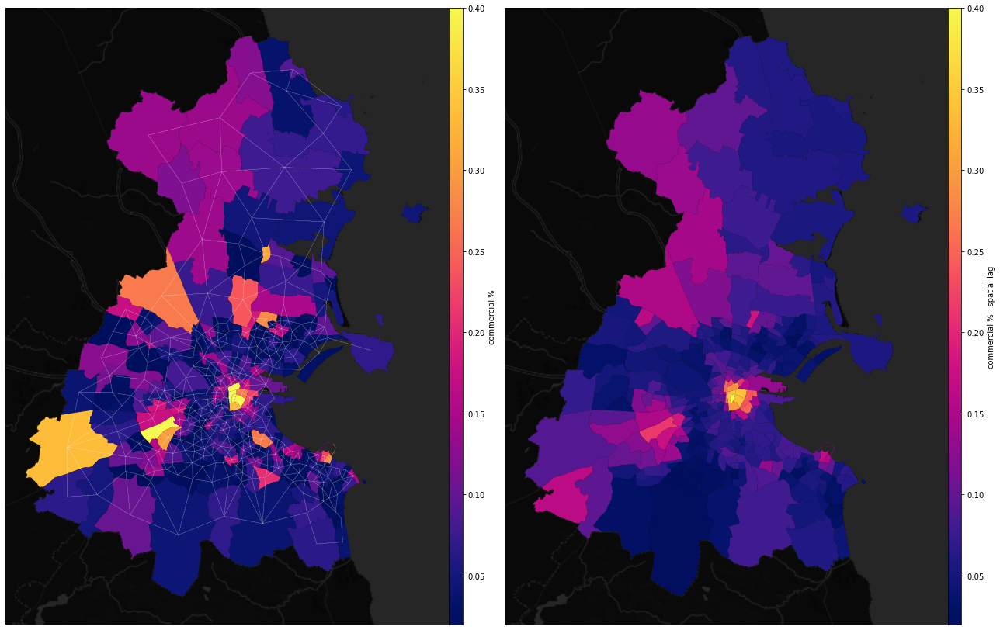

In [1686]:
label = 'commercial %'
plotter(ed_stats, ed_w, column, f'{column}_lag', label, .4)

##  NAV per M2

NavPerM2 is statistically significant


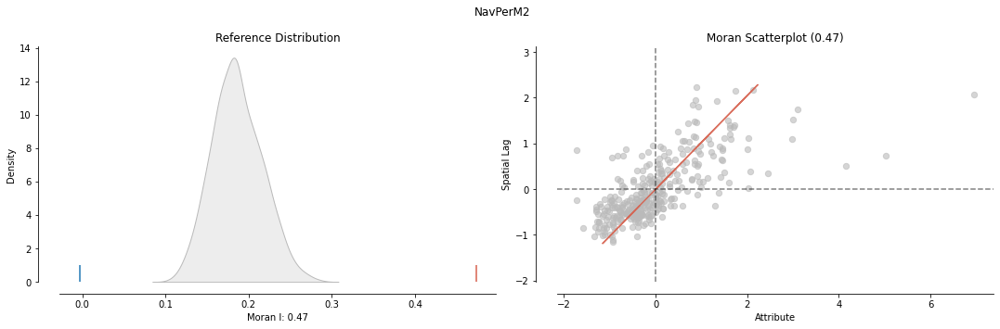

In [1687]:
column = 'NavPerM2'
moran = esda.moran.Moran(ed_stats[column], ed_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_ed_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

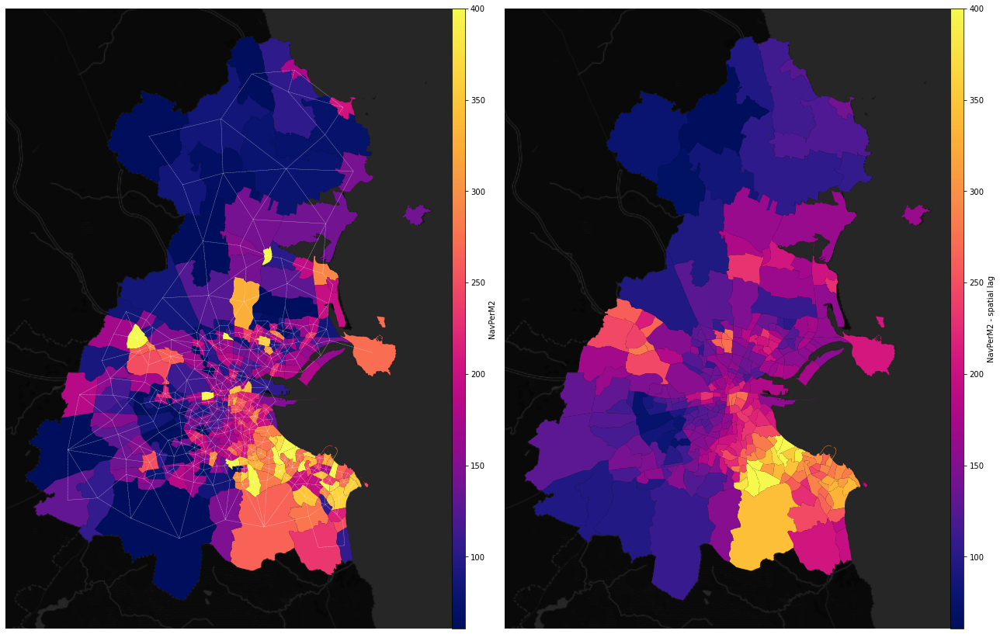

In [1688]:
label = column
plotter(ed_stats, ed_w, column, f'{column}_lag', label, 400)

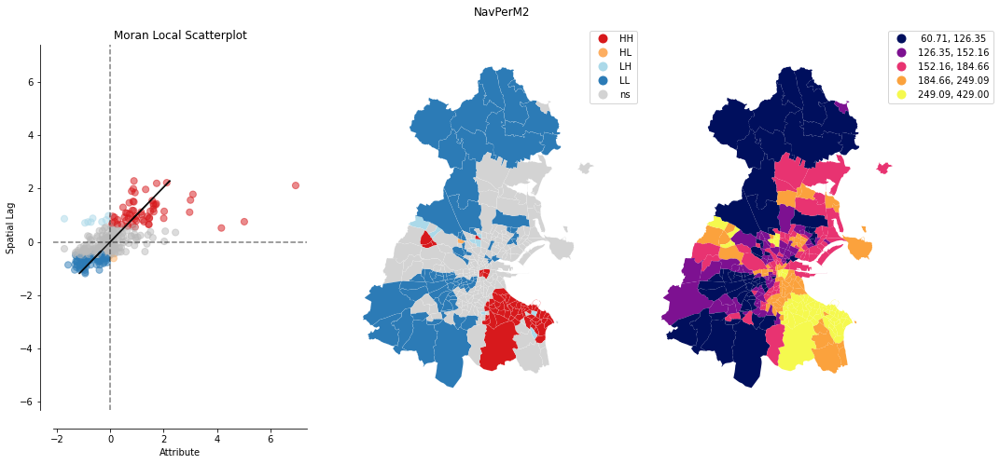

In [1689]:
lisa = esda.moran.Moran_Local(ed_stats[column], ed_w)
fig = plot_local_autocorrelation(lisa,
                                ed_stats,
                                f'{column}_lag',
                                p=.1,
                                scatter_kwds={
                                    "s": 50,
                                    "alpha": .5
                                },
                                cmap=cc.m_CET_L8,
                                figsize=(15, 7))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_ed_local.png', format='png', dpi=200)
plt.show()

##  Net Annual Value

Nav is statistically significant


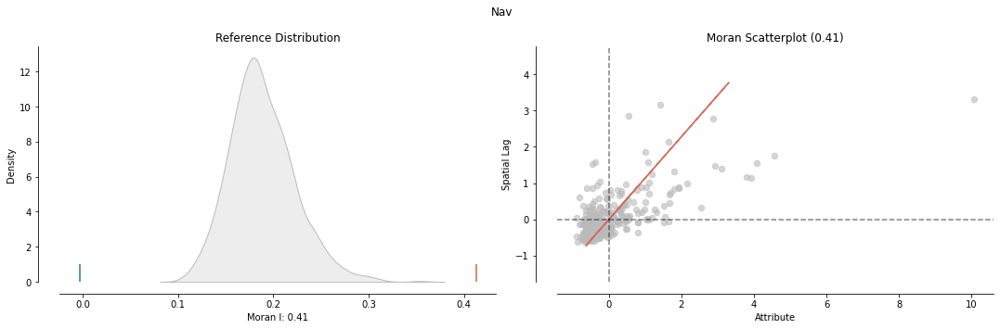

In [1690]:
column = 'Nav'
moran = esda.moran.Moran(ed_stats[column], ed_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_ed_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

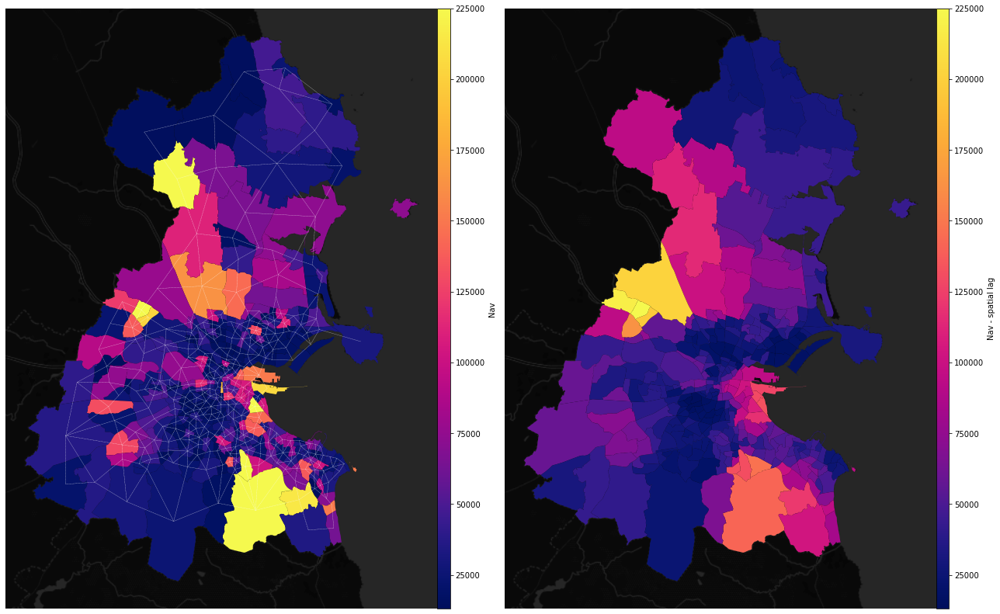

In [1691]:
label = column
plotter(ed_stats, ed_w, column, f'{column}_lag', label, 225000)

##  Area

Area is statistically significant


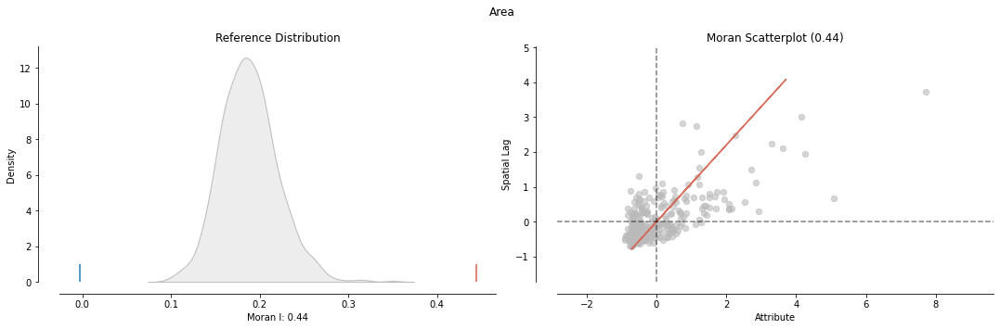

In [1692]:
column = 'Area'
moran = esda.moran.Moran(ed_stats[column], ed_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_ed_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

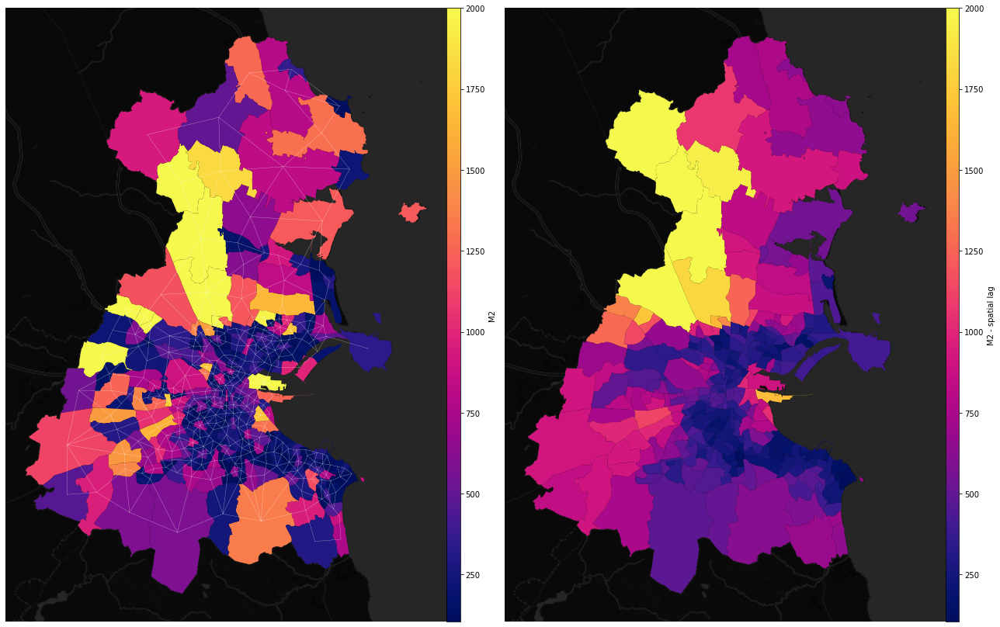

In [1693]:
label = 'M2'
plotter(ed_stats, ed_w, column, f'{column}_lag', label, 2000)

# Small area statistics with spatial lag
https://geographicdata.science/book/notebooks/06_spatial_autocorrelation.html

In [264]:
print(sa[sa.NUTS3NAME=='Dublin'].COUNTYNAME.unique())

['South Dublin' 'Dún Laoghaire-Rathdown' 'Fingal' 'Dublin City']


In [265]:
constraint = (sa.COUNTYNAME.isin(['Dublin City']) )

In [266]:
# Percentage of commercial items.
sa_sum = buildings[['freq', 'res_freq', 'com_freq',
                    'SMALL_AREA_ID']].groupby(['SMALL_AREA_ID']).sum()
sa_sum = pd.merge(sa[constraint],
                  sa_sum,
                  right_index=True,
                  left_on='ESRI_OID',
                  how='left')
sa_sum['com_ratio'] = sa_sum['com_freq'] / sa_sum['freq']
sa_sum.reset_index(drop=True, inplace=True)

In [267]:
# Averaging.
sa_average = pd.merge(buildings, valoff, on='BUILDING_ID', how='right')[[
    'Valuation', 'Area', 'Nav', 'NavPerM2', 'SMALL_AREA_ID'
]].groupby(['SMALL_AREA_ID']).mean()

In [268]:
# Merge all statistics.
sa_stats = pd.merge(
    sa_sum,
    sa_average,
    right_index=True,
    left_on='OBJECTID',
    how='left',
).fillna(0)

In [269]:
# Generate network.
sa_border = sa_stats.dissolve(by='COUNTYNAME', aggfunc='first')
sa_network = gpd.overlay(shapes, sa_border[['geometry']])
sa_stops = feed.get_stops_in_area(sa_border)
sa_stops = gpd.GeoDataFrame(sa_stops,
                            geometry=gpd.points_from_xy(
                                sa_stops.stop_lon,
                                sa_stops.stop_lat,
                                crs={'init': 'epsg:4326'}))
sa_stops = sa_stops.to_crs(epsg=3857)
stop_stats = feed.compute_stop_stats(['20210416'], stop_ids=sa_stops.stop_id)
sa_stops = sa_stops.merge(stop_stats, how='inner', on='stop_id')

In [270]:
# Network statistics.
sa_stats['num_trips'] = gpd.sjoin(
    sa_stats, sa_stops, how='left',
    op='contains').groupby('OBJECTID').num_trips.sum().values

In [271]:
# Generate W from the GeoDataFrame.
sa_w = Queen.from_dataframe(sa_stats)

In [272]:
# Include self.
for i, _ in enumerate(sa_w.neighbors):
    indices = sa_w.neighbors[i]
    indices.append(i)
    sa_w.neighbors.update({i: indices})
    sa_w.weights.update({i: [1] * len(indices)})

In [273]:
# Row-standardization.
sa_w.transform = 'R'

In [274]:
# Calculate spatial lag.
sa_stats['freq_lag'] = spatial_lag.lag_spatial(sa_w, sa_stats['freq'])
sa_stats['com_freq_lag'] = spatial_lag.lag_spatial(sa_w, sa_stats['com_freq'])
sa_stats['com_ratio_lag'] = sa_stats['com_freq_lag'] / sa_stats['freq_lag']
sa_stats['num_trips_lag'] = spatial_lag.lag_spatial(sa_w, sa_stats['num_trips'])
sa_stats['NavPerM2_lag'] = spatial_lag.lag_spatial(sa_w, sa_stats['NavPerM2'])
sa_stats['Nav_lag'] = spatial_lag.lag_spatial(sa_w, sa_stats['Nav'])
sa_stats['Area_lag'] = spatial_lag.lag_spatial(sa_w, sa_stats['Area'])

## Transit network overview

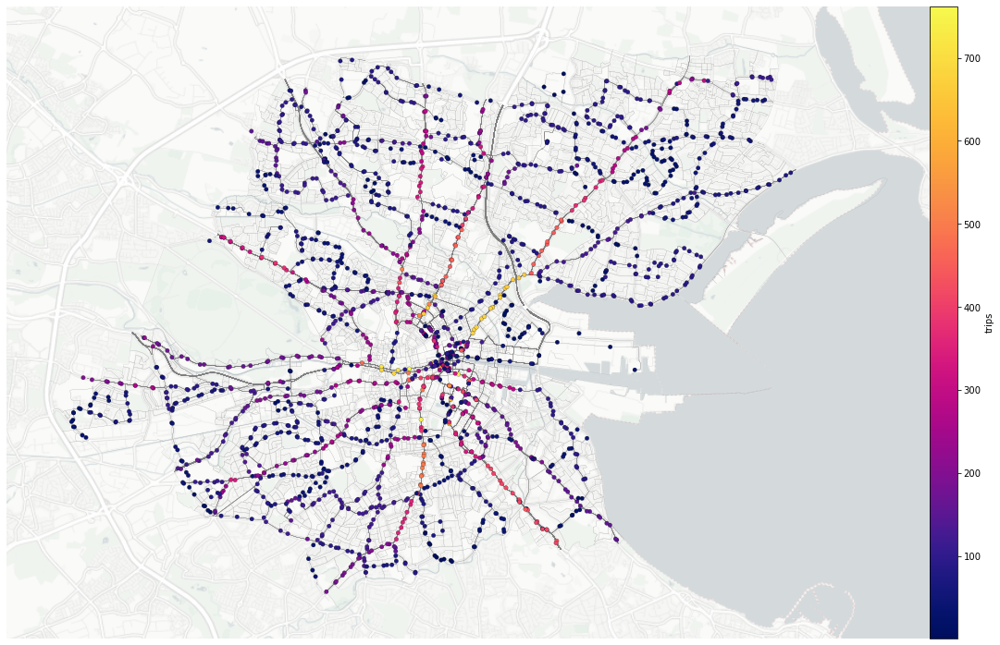

In [275]:
# Specify maptiles source.
source = ctx.providers.CartoDB.PositronNoLabels
fig, ax = plt.subplots(figsize=(15, 18))
fig.tight_layout()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='3%', pad='0%')
sa_stats.plot(lw=.1, ec='grey', fc='none', ax=ax, zorder=1)
sa_network.plot(lw=.1, ec='grey', ax=ax, zorder=5)
sa_stops.plot(
    column='num_trips',
    markersize=20,
    ec='k',
    lw=.2,
    ax=ax,
    cax=cax,
    zorder=10,
    cmap=cc.m_CET_L8,
    legend=True,
    legend_kwds={
        'label': 'trips',
    },
)
ax.set_axis_off()
ctx.add_basemap(ax, attribution=False, source=source, zoom=12)

##  Commercial share

com_ratio is statistically significant


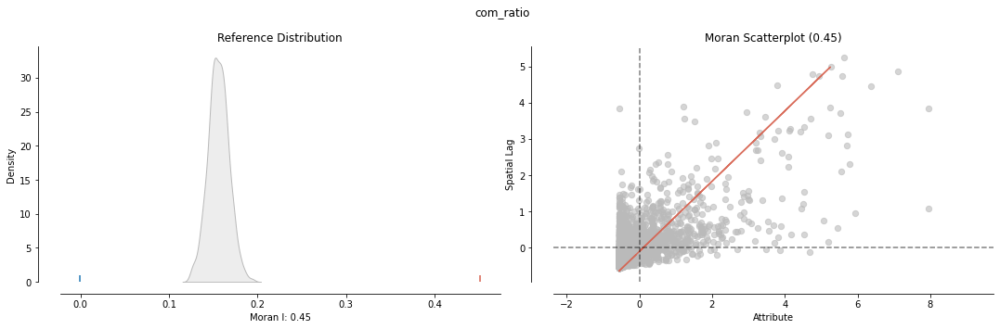

In [276]:
column = 'com_ratio'
moran = esda.moran.Moran(sa_stats[column], sa_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_sa_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

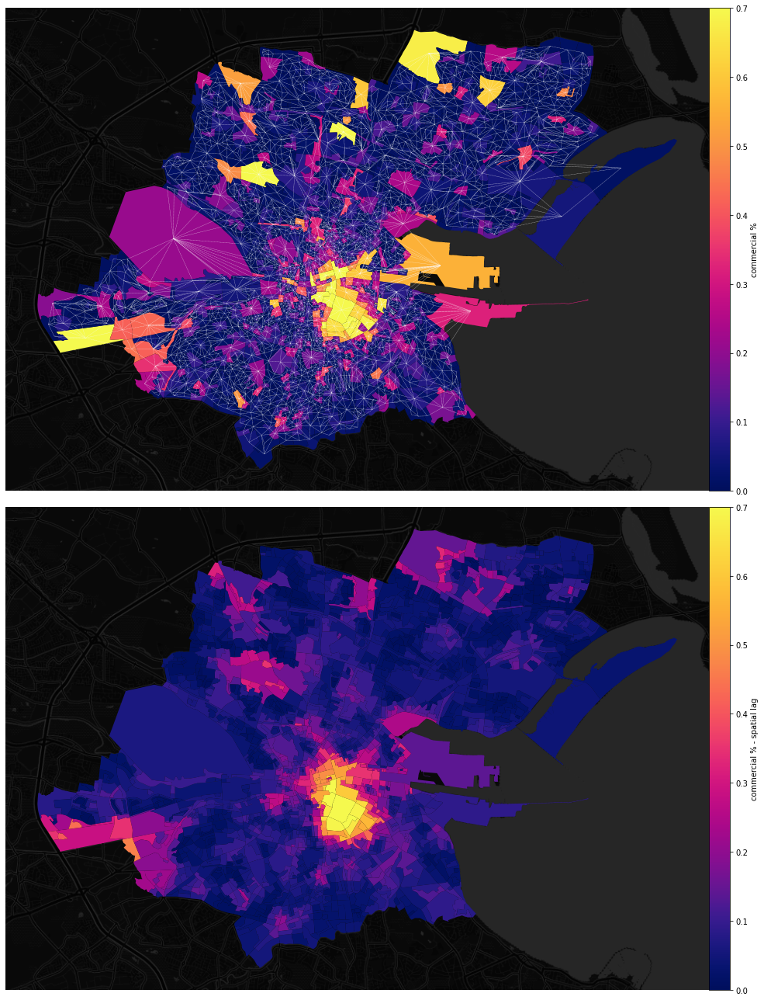

In [277]:
label = 'commercial %'
plotter(
    sa_stats,
    sa_w,
    column,
    f'{column}_lag',
    label,
    .7,
    'landscape',
)

# Number of trips

num_trips is statistically significant


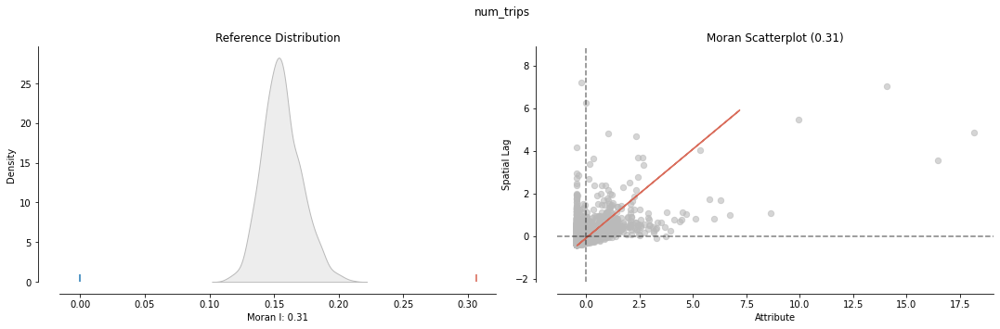

In [278]:
column = 'num_trips'
moran = esda.moran.Moran(sa_stats[column], sa_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_sa_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

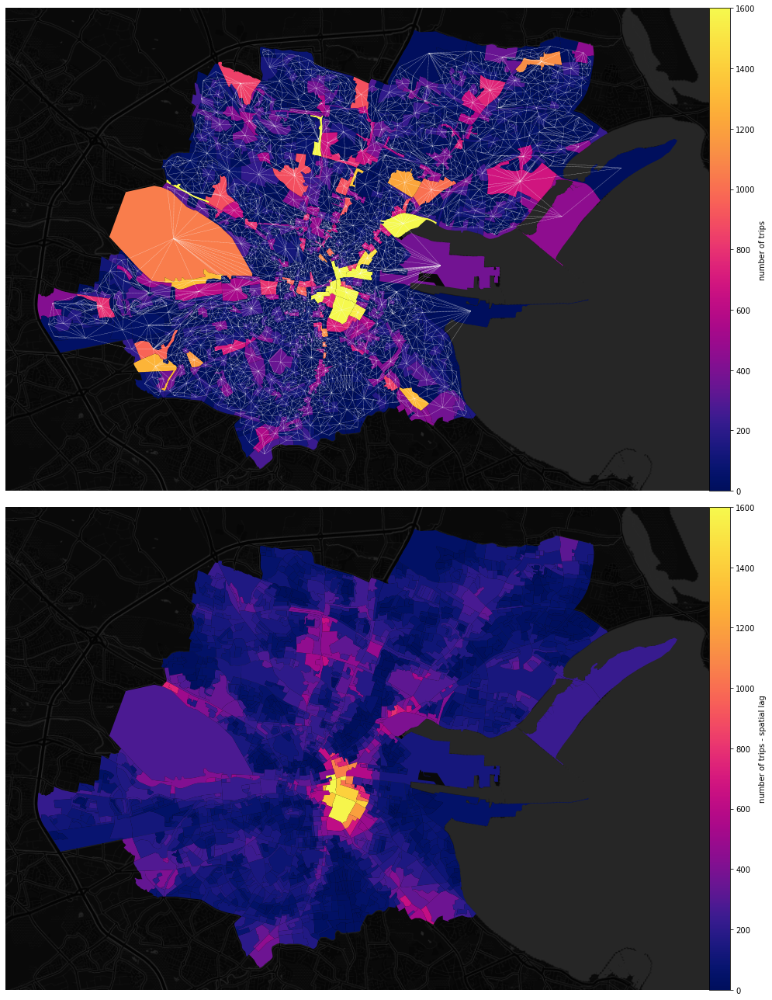

In [279]:
label = 'number of trips'
plotter(
    sa_stats,
    sa_w,
    column,
    f'{column}_lag',
    label,
    1600,
    'landscape',
)

##  NAV per M2

NavPerM2 is statistically significant


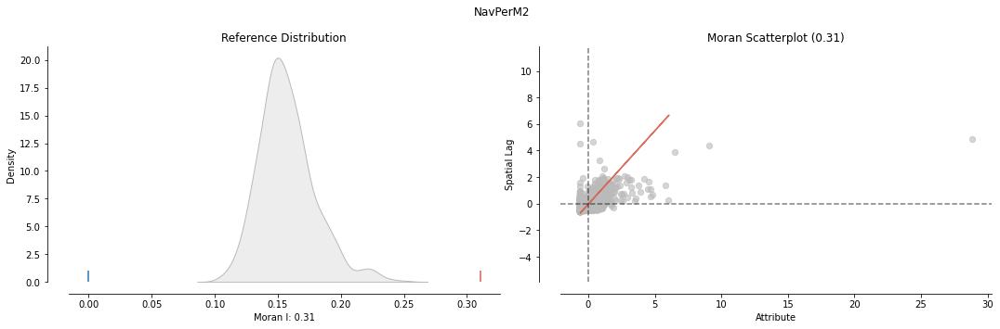

In [280]:
column = 'NavPerM2'
moran = esda.moran.Moran(sa_stats[column], sa_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_sa_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

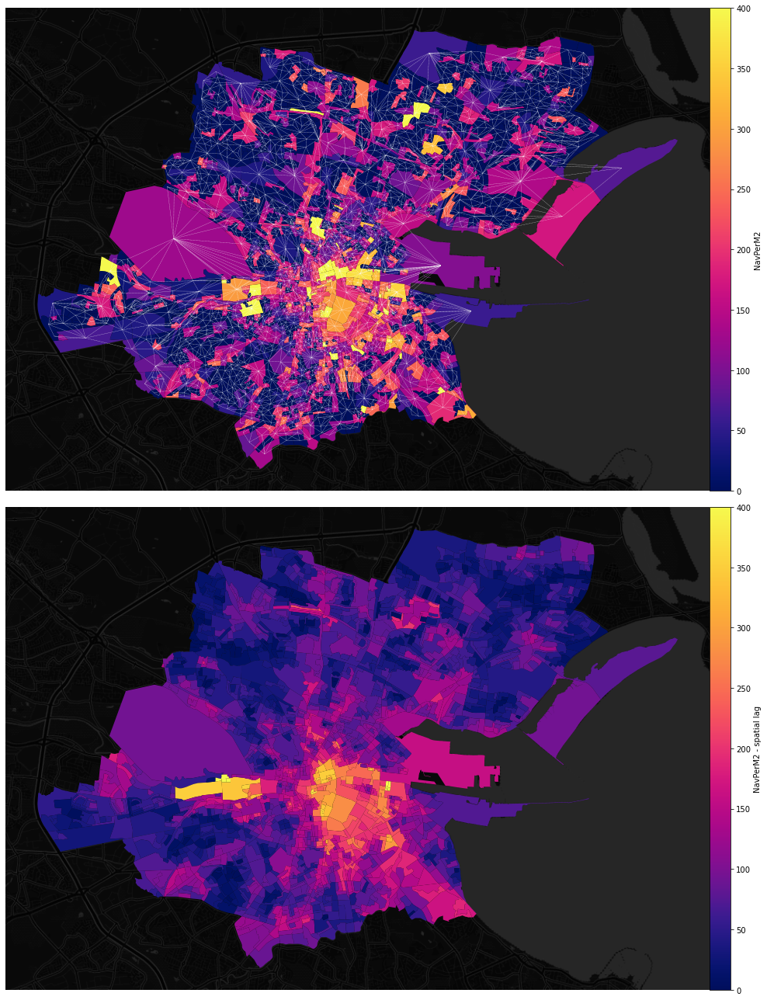

In [281]:
label = column
plotter(
    sa_stats,
    sa_w,
    column,
    f'{column}_lag',
    label,
    400,
    'landscape',
)

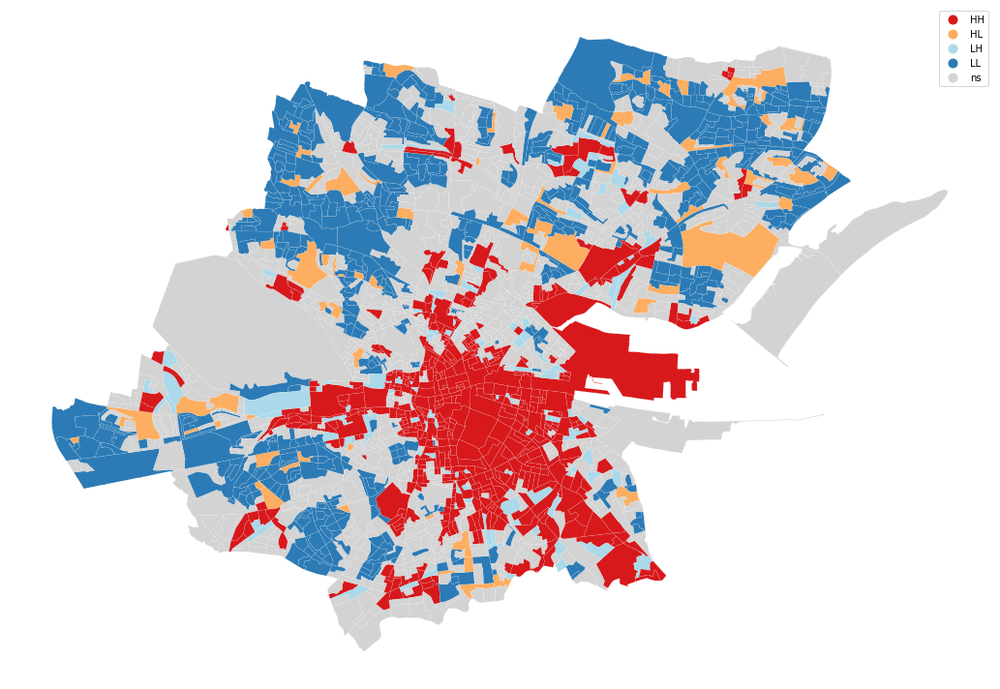

In [282]:
lisa = esda.moran.Moran_Local(sa_stats[column], sa_w)
fig = lisa_cluster(lisa, sa_stats, p=.2, figsize=(15, 10))[0]
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_sa_local.png', format='png', dpi=200)
plt.show()

##  Net Annual Value

Nav is statistically irrelevant


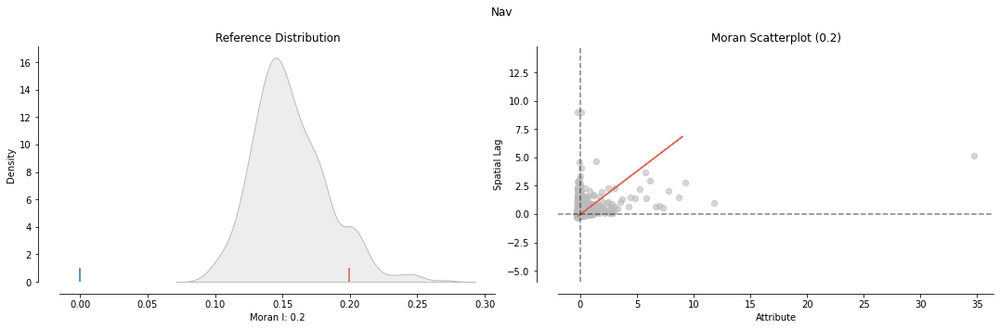

In [283]:
column = 'Nav'
moran = esda.moran.Moran(sa_stats[column], sa_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_sa_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

In [284]:
moran.p_sim

0.084

##  Area

Area is statistically irrelevant


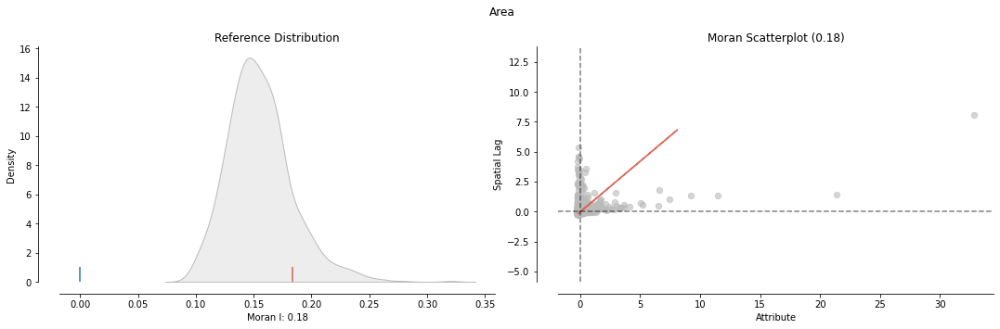

In [285]:
column = 'Area'
moran = esda.moran.Moran(sa_stats[column], sa_w)
fig = plot_moran(moran, figsize=(15, 5))[0]
fig.suptitle(f'{column}')
fig.tight_layout()
fig.savefig(f'./data/Eircode/{column}_sa_moran.png', format='png', dpi=200)
if moran.p_sim <= 0.001:
    print(f'{column} is statistically significant')
else:
    print(f'{column} is statistically irrelevant')

In [286]:
moran.p_sim

0.137

*****************************************************